# COVID_19 Analysis and Cases Forecasting

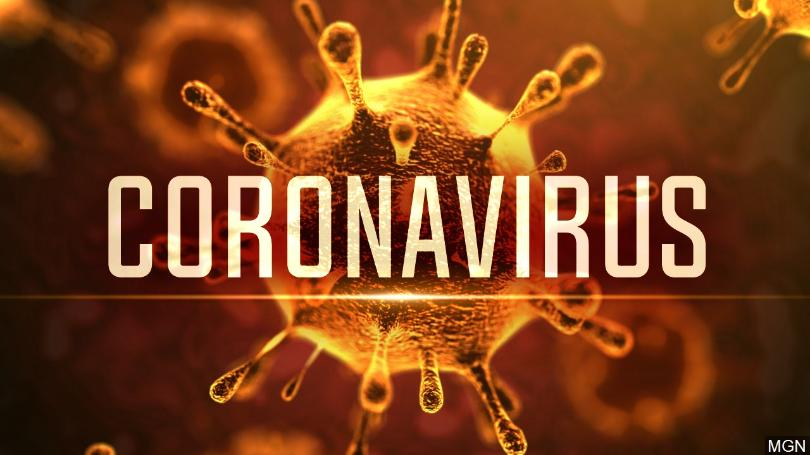

### *By Sharon Maswai, Jasline Gati, Stephanie Omwanda and Maureen Mathenge*

# Defining the Question

What is Covid19?

COVID-19(Corona Virus, Discovered in 2019) is a respiratory illness caused by a new virus. Symptoms include fever, coughing, sore throat and shortness of breath. The virus can spread from person to person, but good hygiene can prevent infection.

## a) Specifying the Question

Objective of this notebook is to study COVID-19 outbreak with the help of some basic visualizations techniques. Comparison of China where the COVID-19 originally originated from with the Rest of the World. Perform predictions and Time Series forecasting in order to study the impact and spread of the COVID-19 in comming days.

## b) Defining the Metric for Success


The metric for success in this project will be a well fitted and fairly accurate predictive regression and classification models that will optimumly Perform predictions and Time Series forecasting in order to study the impact and spread of the COVID-19 in comming days. 

## c) Understanding the context


**From Related Information about COVID-19,**

COVID-19 may not be fatal but it spreads faster than other diseases, like common cold. Every virus has Basic Reproduction number (R0) which implies how many people will get the disease from the infected person. As per inital reseach work R0 of COVID-19 is 2.7.

Currently the goal of all scientists around the world is to "Flatten the Curve". COVID-19 currently has exponential growth rate around the world which we will be seeing in the notebook ahead. Flattening the Curve typically implies even if the number of Confirmed Cases are increasing but the distribution of those cases should be over longer timestamp. To put it in simple words if say suppose COVID-19 is going infect 100K people then those many people should be infected in 1 year but not in a month.

The sole reason to Flatten the Curve is to reudce the load on the Medical Systems so as to increase the focus of Research to find the Medicine for the disease.

Every Pandemic has four stages:

* Stage 1: Confirmed Cases come from other countries

* Stage 2: Local Transmission Begins

* Stage 3: Communities impacted with local transimission

* Stage 4: Significant Transmission with no end in sight

Italy and Korea are the two countries which are currently in Stage 4 While India is in Stage 2.

Other ways to tackle the disease like Corona other than Travel Ban, Cross-Border shutdown, Ban on immigrants are Testing, Contact Tracing and Quarantine.

## d) Recording the Experimental Design


The main aim of the project is to create a predictive models  Perform predictions and Time Series forecasting in order to study the impact and spread of the COVID-19 in comming days. Data cleaning and exploratory data analysis will be done before creating the model and evaluation of the model and a final documentation of the project.

## e) Data Relevance


COVID19 is very relevant as its a current pandemic that has taken the world by the horns adn has really tested and shook the whole human race. Understanding its impact and creating predictive models is very necessary as  it shall help us come up with various insights and relevant measures where necessary

# Data Preparation

## 1. Importing Libraries

In [282]:
# This Python 3 environment comes with many helpful analytics libraries installed


import numpy as np 
import pandas as pd 

import re #regular expressions
import plotly.express as px
# Plotting
import matplotlib.pylab as plt
import seaborn as sns

#Progress bar
from tqdm import tqdm
from datetime import datetime
import os
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

#

/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv
/kaggle/input/novel-corona-virus-2019-dataset/COVID19_open_line_list.csv
/kaggle/input/novel-corona-virus-2019-dataset/COVID19_line_list_data.csv
/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths_US.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed_US.csv
/kaggle/input/ebola-outbreak-20142016-complete-dataset/ebola_2014_2016_clean.csv
/kaggle/input/ebola-outbreak-20142016-complete-dataset/ebola_data_db_format.csv
/kaggle/input/sars-outbreak-2003-complete-dataset/sars_2003_complete_dataset_clean.csv


## 2. Importing and loading datasets

In [283]:
#upload the data
path = '../input/novel-corona-virus-2019-dataset/covid_19_data.csv'
path2 = '../input/novel-corona-virus-2019-dataset/COVID19_line_list_data.csv'
path3 = '../input/novel-corona-virus-2019-dataset/COVID19_open_line_list.csv'
path4 = '../input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed_US.csv'
path5 = '../input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv'
path6 = '../input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths_US.csv'
path7 = '../input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv'
path8 = '../input/novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv'

In [284]:
#loading datasets
covid_df = pd.read_csv(path)
covid_line = pd.read_csv(path2)
global_data = pd.read_csv(path3)
us_confirmed = pd.read_csv(path4)
confirmed = pd.read_csv(path5)
us_deaths = pd.read_csv(path6)
deaths = pd.read_csv(path7)
recovered = pd.read_csv(path8)

## Covid_19 dataset

#### ****Column Description****
* Sno - Serial number
* ObservationDate - Date of the observation in MM/DD/YYYY
* Province/State - Province or state of the observation (Could be empty when missing)
* Country/Region - Country of observation
* Last Update - Time in UTC at which the row is updated for the given province or country. (Not standardised and so please clean before using it)
* Confirmed - Cumulative number of confirmed cases till that date
* Deaths - Cumulative number of of deaths till that date
* Recovered - Cumulative number of recovered cases till that date

In [285]:
#loading the latest covid_19 dataset
display(covid_df)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
21538,21539,05/04/2020,Wyoming,US,2020-05-05 02:32:34,596.0,7.0,0.0
21539,21540,05/04/2020,Xinjiang,Mainland China,2020-05-05 02:32:34,76.0,3.0,73.0
21540,21541,05/04/2020,Yukon,Canada,2020-05-05 02:32:34,11.0,0.0,0.0
21541,21542,05/04/2020,Yunnan,Mainland China,2020-05-05 02:32:34,185.0,2.0,181.0


### Checking dimmensions and datatypes

In [286]:
#checking the shape of the dataset
covid_df.shape

(21543, 8)

In [287]:
#checking the datatypes
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21543 entries, 0 to 21542
Data columns (total 8 columns):
SNo                21543 non-null int64
ObservationDate    21543 non-null object
Province/State     10446 non-null object
Country/Region     21543 non-null object
Last Update        21543 non-null object
Confirmed          21543 non-null float64
Deaths             21543 non-null float64
Recovered          21543 non-null float64
dtypes: float64(3), int64(1), object(4)
memory usage: 1.3+ MB


Observations:
* There are 4 object datatypes, 3 float datatypes and 1 integer datatype. Half the columns are numerical and the other half is categorical.

### Statistical summary

In [288]:
#Statistical description of dataset
covid_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SNo,21543.0,10772.000000,6219.072760,1.0,5386.5,10772.0,16157.5,21543.0
Confirmed,21543.0,4078.755791,18788.782457,0.0,12.0,134.0,935.0,318953.0
Deaths,21543.0,259.551734,1776.347640,0.0,0.0,1.0,13.0,29079.0
Recovered,21543.0,1111.196305,7750.116630,0.0,0.0,3.0,105.0,187180.0


### Converting to datetime datatype

In [289]:
#Split the date column into month and year then add those two columns

covid_df.ObservationDate = covid_df.ObservationDate.apply(lambda x: x.replace('/', '-'))
covid_df['observation_date']= pd.to_datetime(covid_df['ObservationDate']) 

#coverting last update into datetime

covid_df['last_update'] = covid_df['Last Update'].apply(lambda x: x.replace('/', '-'))
covid_df['last_update']= pd.to_datetime(covid_df['Last Update']) 

covid_df.head()


,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,observation_date,last_update
0,1,01-22-2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0,2020-01-22,2020-01-22 17:00:00
1,2,01-22-2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0,2020-01-22,2020-01-22 17:00:00
2,3,01-22-2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0,2020-01-22,2020-01-22 17:00:00
3,4,01-22-2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0,2020-01-22,2020-01-22 17:00:00
4,5,01-22-2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0,2020-01-22,2020-01-22 17:00:00


In [290]:
#confirming change in datatypes
covid_df.dtypes

SNo                          int64
ObservationDate             object
Province/State              object
Country/Region              object
Last Update                 object
Confirmed                  float64
Deaths                     float64
Recovered                  float64
observation_date    datetime64[ns]
last_update         datetime64[ns]
dtype: object

### Unique values

In [291]:
cols=covid_df.columns.to_list()

for column in cols:
   print("\n")
   print("Column Name:", column)
   print(covid_df[column].unique())



Column Name: SNo
[    1     2     3 ... 21541 21542 21543]


Column Name: ObservationDate
['01-22-2020' '01-23-2020' '01-24-2020' '01-25-2020' '01-26-2020'
 '01-27-2020' '01-28-2020' '01-29-2020' '01-30-2020' '01-31-2020'
 '02-01-2020' '02-02-2020' '02-03-2020' '02-04-2020' '02-05-2020'
 '02-06-2020' '02-07-2020' '02-08-2020' '02-09-2020' '02-10-2020'
 '02-11-2020' '02-12-2020' '02-13-2020' '02-14-2020' '02-15-2020'
 '02-16-2020' '02-17-2020' '02-18-2020' '02-19-2020' '02-20-2020'
 '02-21-2020' '02-22-2020' '02-23-2020' '02-24-2020' '02-25-2020'
 '02-26-2020' '02-27-2020' '02-28-2020' '02-29-2020' '03-01-2020'
 '03-02-2020' '03-03-2020' '03-04-2020' '03-05-2020' '03-06-2020'
 '03-07-2020' '03-08-2020' '03-09-2020' '03-10-2020' '03-11-2020'
 '03-12-2020' '03-13-2020' '03-14-2020' '03-15-2020' '03-16-2020'
 '03-17-2020' '03-18-2020' '03-19-2020' '03-20-2020' '03-21-2020'
 '03-22-2020' '03-23-2020' '03-24-2020' '03-25-2020' '03-26-2020'
 '03-27-2020' '03-28-2020' '03-29-2020' '03-30-202

### Dealing with missing values

In [292]:
covid_df.isna().sum()

SNo                     0
ObservationDate         0
Province/State      11097
Country/Region          0
Last Update             0
Confirmed               0
Deaths                  0
Recovered               0
observation_date        0
last_update             0
dtype: int64

In [293]:
covid_df=covid_df.drop(['Province/State','Last Update', 'ObservationDate'], 1, inplace= False)

In [294]:
#confirming no missing values
covid_df.isna().sum()

SNo                 0
Country/Region      0
Confirmed           0
Deaths              0
Recovered           0
observation_date    0
last_update         0
dtype: int64

In [295]:
#lower case
covid_df.columns = map(str.lower, covid_df.columns)
covid_df.columns

Index(['sno', 'country/region', 'confirmed', 'deaths', 'recovered',
       'observation_date', 'last_update'],
      dtype='object')

#### Duplicate values

In [296]:
covid_df.duplicated().any()

False

There are no duplicated values.

## global_data dataset


****Column description****

ID - Unique identifer for reported case. Currently ID is run concurrently for cases reported from Hubei, China and cases reported outside of Hubei, China. ID order does not necessarily refect epidemiological progression, or reporting date, and should not be used to order cases in temporal progression.

age - Age of the case reported in years. When not reported, N/A is used. Age ranges are recorded as start_ age-end_age e.g. 50–59.

sex - Sex of the case. When not reported, N/A is used.

city – Initial generic geographic metadata is reported here. Subsequently standardized via lookup with geographic reference table.

province – Initial entry of name of the frst administrative division in which the case is reported. Subsequently standardized via lookup with geographic reference table.

country - Name of country in which the case is reported. Note that imported cases will be assigned to the country in which confrmation occurred - this is typically in the arrival country, rather than the site of infection. “Travel_ history_location” will describe other locations of travel for such instances.

wuhan(0)_not_wuhan(1) - Binary fag to distinguish cases from Wuhan, Hubei, China, from all other cases. 0 denotes a case is reported in Wuhan, 1 denotes a case reported elsewhere in the world.

latitude - The latitude of the specific location (denoted as “point” in “geo_resolution”) where the case was reported, or the latitude of a representative location (denoted as “admin” in “geo_resolution”) within the administrative unit the case is reported.

longitude - Te longitude of the specifc location (denoted as “point” in “geo_resolution”) where the case was reported, or the longitude of a representative location (denoted as “admin” in “geo_resolution”) within the administrative unit the case is reported.

geo_resolution - An indicative feld in which the spatial representativeness of “latitude” and “longitude” are described. “point” indicates that a specifc location is being represented by these coordinates. “admin” denotes that the coordinates are representative of the administrative unit in which coordinates lie. Subsequent “admin3”, “admin2”, “admin1” and corresponding “admin_id” and “shapefle” will allow for a more specifc representation to be had.

date_onset_symptoms - Date when the reported case was recorded to have become symptomatic. Specifc dates are reported as DD.MM.YYYY. Ranges are recorded as DD.MM.YYYY - DD.MM.YYYY. Ranges with uncertain start or fnish dates are recorded as - DD.MM.YYYY and DD.MM.YYYY - respectively.

date_admission_hospital - Date when the reported case was recorded to have been hospitalized. Specifc dates are reported as DD.MM.YYYY. Ranges are recorded as DD.MM.YYYY - DD.MM.YYYY. Ranges with uncertain start or fnish dates are recorded as - DD.MM.YYYY and DD.MM.YYYY - respectively.

date_confirmation - Date when the reported case was confirmed as having COVID-19 using rt-PCR. Confrmation accuracy is contingent on the data source used. Specifc dates are reported as DD.MM.YYYY. Ranges are recorded as DD.MM.YYYY - DD.MM.YYYY. Ranges with uncertain start of fnish dates are recorded as - DD.MM.YYYY and DD.MM.YYYY - respectively.

symptoms - List of symptoms recorded in the description of the case.

lives_in_Wuhan - Recorded relationship of patient with city of Wuhan, Hubei, China. “yes” indicates that the case was a resident of Wuhan. “no” indicates that the case is not a resident of Wuhan (residential). No information indicates that no data was available.

travel_history_dates - Recorded travel dates to and from Wuhan. Specifc dates are reported as DD.MM.YYYY and indicate date when the individual lef Wuhan. Ranges are recorded as DD.MM.YYYY - DD.MM.YYYY when both are available. Ranges with uncertain start of fnish dates are recorded as - DD.MM.YYYY and DD.MM. YYYY - respectively.

travel_history_location - An open feld describing the recent recorded travel history of the case. reported_market_exposure - An open feld indicating “yes” if there was reported market exposure and “no” if there was not. N/A indicates that no information is provided.

additional_information - Any additional information that may be informative about the case, such as the occupation of the patient, the purpose of their travels, the hospital they were admitted to, etc. chronic_disease_binary - 0 represents a case that was reported to have no chronic disease and 1 represents cases that reported a chronic disease

chronic_disease - Reported chronic condition(s) of the reported case.

source - URL identifying the source of this information

sequence_available - If there was a genomic sequence available the accession number is inserted here.

outcome - Patients outcome, as either “died” or “discharged” from hospital.

date_death_or_discharge - Reported date of death or discharge in DD.MM.YYYY format.

location – Location of the reported case.

admin3 – Administrative unit level 3 (e.g., zip code) of where the case was reported.

admin2 – Administrative unit level 2 (e.g., county) of where the case was reported.

admin1 – Administrative unit level 1 (e.g., province) of where the case was reported.

country_new – Administrative unit level 0 (e.g., country) of where the case was reported.

admin_id – Administrative unit ID of the lowest level available for the case reported.

In [297]:
global_data.head()

,ID,age,sex,city,province,country,wuhan(0)_not_wuhan(1),latitude,longitude,geo_resolution,...,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44
0,1.0,30,male,"Chaohu City, Hefei City",Anhui,China,1.0,31.646960,117.716600,admin3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,47,male,"Baohe District, Hefei City",Anhui,China,1.0,31.778630,117.331900,admin3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,49,male,"High-Tech Zone, Hefei City",Anhui,China,1.0,31.828313,117.224844,point,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,47,female,"High-Tech Zone, Hefei City",Anhui,China,1.0,31.828313,117.224844,point,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,50,female,"Feidong County, Hefei City",Anhui,China,1.0,32.001230,117.568100,admin3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [298]:
global_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14126 entries, 0 to 14125
Data columns (total 45 columns):
ID                          13173 non-null float64
age                         1349 non-null object
sex                         1264 non-null object
city                        10194 non-null object
province                    12906 non-null object
country                     13148 non-null object
wuhan(0)_not_wuhan(1)       13170 non-null float64
latitude                    13147 non-null float64
longitude                   13147 non-null float64
geo_resolution              13147 non-null object
date_onset_symptoms         746 non-null object
date_admission_hospital     730 non-null object
date_confirmation           13089 non-null object
symptoms                    493 non-null object
lives_in_Wuhan              565 non-null object
travel_history_dates        503 non-null object
travel_history_location     758 non-null object
reported_market_exposure    35 non-null object
addi

In [299]:
# checking unique values

cols=global_data.columns.to_list()

for column in cols:
   print("\n")
   print("Column Name:", column)
   print(global_data[column].unique())



Column Name: ID
[1.0000e+00 2.0000e+00 3.0000e+00 ... 1.3477e+04 1.3478e+04 1.3479e+04]


Column Name: age
['30' '47' '49' '50' nan '42' '59' '39' '38' '45' '33' '37' '32' '18' '56'
 '44' '65' '21' '41' '70' '43' '31' '24' '40' '66' '36' '10' '63' '78'
 '76' '48' '62' '46' '34' '72' '20' '54' '2' '29' '61' '51' '80' '69' '28'
 '55' '68' '57' '35' '27' '52' '22' '23' '88' '19' '60' '58' '53' '25'
 '36-45' '26' '64' '30-39' '11' '50-59' '73' '74' '7' '82' '67' '15' '16'
 '60-69' '40-49' '80-89' '27-40' '5' '3' '4' '71' '20-29' '77' '75'
 '16-80' '94' '38-68' '23-72' '81' '0.58333' '17' 'Belgium' '8' '9'
 '0.08333' '12' '0.5' '83' '84' '60-60' '1' '79' '87' '22-80' '19-77'
 '8-68' '21-72' '40-89' '0.25' '13-19' '70-79' '80-80' '0-6' '0-10'
 '10-19' '96' '1.75' '18-65' '0-18']


Column Name: sex
['male' 'female' nan '4000' 'Female' 'Male']


Column Name: city
['Chaohu City, Hefei City' 'Baohe District, Hefei City'
 'High-Tech Zone, Hefei City' 'Feidong County, Hefei City' "Lu'an City"
 '

In [300]:
global_data.shape

(14126, 45)

### Handling non-NaN values

In [301]:
#replacing non-NAN values with nan in the sex column
global_data=global_data.replace(['4000'],np.nan)
global_data['sex']=global_data['sex'].str.lower()
global_data.sex.unique()

array(['male', 'female', nan], dtype=object)

In [302]:
#replacing non-NAN values with nan in the age column
global_data=global_data.replace(['0.58333', 'Belgium', '0.08333'],np.nan)
global_data.age.unique()

array(['30', '47', '49', '50', nan, '42', '59', '39', '38', '45', '33',
       '37', '32', '18', '56', '44', '65', '21', '41', '70', '43', '31',
       '24', '40', '66', '36', '10', '63', '78', '76', '48', '62', '46',
       '34', '72', '20', '54', '2', '29', '61', '51', '80', '69', '28',
       '55', '68', '57', '35', '27', '52', '22', '23', '88', '19', '60',
       '58', '53', '25', '36-45', '26', '64', '30-39', '11', '50-59',
       '73', '74', '7', '82', '67', '15', '16', '60-69', '40-49', '80-89',
       '27-40', '5', '3', '4', '71', '20-29', '77', '75', '16-80', '94',
       '38-68', '23-72', '81', '17', '8', '9', '12', '0.5', '83', '84',
       '60-60', '1', '79', '87', '22-80', '19-77', '8-68', '21-72',
       '40-89', '0.25', '13-19', '70-79', '80-80', '0-6', '0-10', '10-19',
       '96', '1.75', '18-65', '0-18'], dtype=object)

### Dropping columns

In [303]:
#dropping irrelevant columns
columns = ['Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36', 'Unnamed: 37','Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43', 'Unnamed: 44']

global_data = global_data.drop(columns,  axis=1, inplace = False)

global_data.head()

,ID,age,sex,city,province,country,wuhan(0)_not_wuhan(1),latitude,longitude,geo_resolution,...,outcome,date_death_or_discharge,notes_for_discussion,location,admin3,admin2,admin1,country_new,admin_id,data_moderator_initials
0,1.0,30,male,"Chaohu City, Hefei City",Anhui,China,1.0,31.646960,117.716600,admin3,...,NaN,NaN,NaN,NaN,Chaohu City,Hefei City,Anhui,China,340181,NaN
1,2.0,47,male,"Baohe District, Hefei City",Anhui,China,1.0,31.778630,117.331900,admin3,...,NaN,NaN,NaN,NaN,Baohe District,Hefei City,Anhui,China,340111,NaN
2,3.0,49,male,"High-Tech Zone, Hefei City",Anhui,China,1.0,31.828313,117.224844,point,...,NaN,NaN,NaN,High-Tech Zone,Shushan District,Hefei City,Anhui,China,340104,NaN
3,4.0,47,female,"High-Tech Zone, Hefei City",Anhui,China,1.0,31.828313,117.224844,point,...,NaN,NaN,NaN,High-Tech Zone,Shushan District,Hefei City,Anhui,China,340104,NaN
4,5.0,50,female,"Feidong County, Hefei City",Anhui,China,1.0,32.001230,117.568100,admin3,...,NaN,NaN,NaN,NaN,Feidong County,Hefei City,Anhui,China,340122,NaN


### Missing values and duplicates

In [304]:
#checking the percentage of missing values
global_data.isna().mean().round(4) * 100

ID                           6.75
age                         90.47
sex                         91.06
city                        27.84
province                     8.64
country                      6.93
wuhan(0)_not_wuhan(1)        6.77
latitude                     6.93
longitude                    6.93
geo_resolution               6.93
date_onset_symptoms         94.72
date_admission_hospital     94.83
date_confirmation            7.34
symptoms                    96.51
lives_in_Wuhan              96.00
travel_history_dates        96.44
travel_history_location     94.63
reported_market_exposure    99.75
additional_information      82.93
chronic_disease_binary      99.87
chronic_disease             99.91
source                       8.33
sequence_available          99.99
outcome                     98.70
date_death_or_discharge     99.34
notes_for_discussion        98.68
location                    92.75
admin3                      91.80
admin2                      35.81
admin1        

In [305]:
#for age fill nans with unknown(0)
global_data["age"].fillna("unknown", inplace=True)
#when gender is not know fill with unknown
global_data["sex"].fillna("unknown", inplace=True)
#replace unknown values of cities with unknown
global_data["city"].fillna("unknown", inplace=True)
#replace unknown values of province and countries with unknown 
global_data["province"].fillna("unknown", inplace=True)
global_data["date_onset_symptoms"].fillna("unknown", inplace=True)
global_data["date_admission_hospital"].fillna("unknown", inplace=True)
global_data["country"].fillna("unknown", inplace=True)
#we have people we do not know if they come from wuhan or now.We shall replace with 2
#wuhan(0)_not_wuhan(1)
global_data["wuhan(0)_not_wuhan(1)"].fillna("2", inplace=True)

In [306]:
# confirming the imputing
global_data.isna().mean().round(4) * 100

ID                           6.75
age                          0.00
sex                          0.00
city                         0.00
province                     0.00
country                      0.00
wuhan(0)_not_wuhan(1)        0.00
latitude                     6.93
longitude                    6.93
geo_resolution               6.93
date_onset_symptoms          0.00
date_admission_hospital      0.00
date_confirmation            7.34
symptoms                    96.51
lives_in_Wuhan              96.00
travel_history_dates        96.44
travel_history_location     94.63
reported_market_exposure    99.75
additional_information      82.93
chronic_disease_binary      99.87
chronic_disease             99.91
source                       8.33
sequence_available          99.99
outcome                     98.70
date_death_or_discharge     99.34
notes_for_discussion        98.68
location                    92.75
admin3                      91.80
admin2                      35.81
admin1        

In [307]:
columns = ['travel_history_dates','travel_history_location', 'notes_for_discussion','longitude', 'latitude', 'province','city', 'admin1', 'admin2','admin_id', 'geo_resolution', 'admin3', 'outcome', 'reported_market_exposure', 'travel_history_location','chronic_disease', 'sequence_available', 'additional_information', 'data_moderator_initials', 'lives_in_Wuhan', 'symptoms', 'date_death_or_discharge', 'location', 'chronic_disease_binary']

global_data = global_data.drop(columns,  axis=1, inplace = False)

global_data.isna().sum()

ID                          953
age                           0
sex                           0
country                       0
wuhan(0)_not_wuhan(1)         0
date_onset_symptoms           0
date_admission_hospital       0
date_confirmation          1037
source                     1176
country_new                1047
dtype: int64

In [308]:
#dropping rows with missing values
global_data=global_data.dropna()
global_data.isnull().sum()

ID                         0
age                        0
sex                        0
country                    0
wuhan(0)_not_wuhan(1)      0
date_onset_symptoms        0
date_admission_hospital    0
date_confirmation          0
source                     0
country_new                0
dtype: int64

In [309]:
#checking for duplicates
global_data.duplicated().sum()

0

There are no duplicates.

In [310]:
#checking the new shape
global_data.shape

(12806, 10)

Now there are 12,806 rows and 10 columns

## Confirmed cases

In [311]:
##displaying dataset of global confirmed cases
confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,1463,1531,1703,1828,1939,2171,2335,2469,2704,2894
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,712,726,736,750,766,773,782,789,795,803
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,3256,3382,3517,3649,3848,4006,4154,4295,4474,4648
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,738,738,743,743,743,745,745,747,748,750
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,25,26,27,27,27,27,30,35,35,35


In [312]:
confirmed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 108 entries, Province/State to 5/4/20
dtypes: float64(2), int64(104), object(2)
memory usage: 224.6+ KB


In [313]:
confirmed.shape

(266, 108)

### Missing values and duplicates

In [314]:
confirmed.isna().sum()

Province/State    184
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
4/30/20             0
5/1/20              0
5/2/20              0
5/3/20              0
5/4/20              0
Length: 108, dtype: int64

We drop the province/state column since its not significant in our study since we already have the countries.

In [315]:
confirmed=confirmed.drop(['Province/State', 'Long', 'Lat'], 1, inplace= False)

In [316]:
#confirming there are no null values
print(confirmed.isnull().sum())

Country/Region    0
1/22/20           0
1/23/20           0
1/24/20           0
1/25/20           0
                 ..
4/30/20           0
5/1/20            0
5/2/20            0
5/3/20            0
5/4/20            0
Length: 105, dtype: int64


### Coverting object to datetime datatype

In [317]:

 
# confirmed.columns=confirmed.columns.str.strip().str.replace('20','2020')
# confirmed.columns=confirmed.columns.str.strip().str.replace('/','-')

In [318]:
confirmed.columns

Index(['Country/Region', '1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20',
       '1/27/20', '1/28/20', '1/29/20', '1/30/20',
       ...
       '4/25/20', '4/26/20', '4/27/20', '4/28/20', '4/29/20', '4/30/20',
       '5/1/20', '5/2/20', '5/3/20', '5/4/20'],
      dtype='object', length=105)

### Unique values

In [319]:
cols=confirmed.columns.to_list()

for column in cols:
   print("\n")
   print("Column Name:", column)
   print(confirmed[column].unique())



Column Name: Country/Region
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina' 'Brazil'
 'Brunei' 'Bulgaria' 'Burkina Faso' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Congo (Brazzaville)' 'Congo (Kinshasa)' 'Costa Rica' "Cote d'Ivoire"
 'Croatia' 'Diamond Princess' 'Cuba' 'Cyprus' 'Czechia' 'Denmark'
 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador'
 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji'
 'Finland' 'France' 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece'
 'Guatemala' 'Guinea' 'Guyana' 'Haiti' 'Holy See' 'Honduras' 'Hungary'
 'Iceland' 'India' 'Indonesia' 'Iran' 'Iraq' 'Ireland' 'Israel' 'Italy'
 'Jamaica' 'Japan' 'Jordan' 'Kazakhstan' 'Kenya' 'Korea, South' 'Kuwait'
 'Kyr

## Recovered

In [320]:
recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,188,207,220,228,252,260,310,331,345,397
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,403,410,422,431,455,470,488,519,531,543
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,1479,1508,1558,1651,1702,1779,1821,1872,1936,1998
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,344,344,385,398,423,468,468,472,493,499
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,6,6,6,6,7,7,11,11,11,11


In [321]:
recovered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252 entries, 0 to 251
Columns: 108 entries, Province/State to 5/4/20
dtypes: float64(2), int64(104), object(2)
memory usage: 212.8+ KB


In [322]:
recovered.shape

(252, 108)

### unique values

In [323]:
cols=recovered.columns.to_list()
for column in cols:
   print("\n")
   print("Column Name:", column)
   print(recovered[column].unique())



Column Name: Province/State
[nan 'Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia'
 'Anhui' 'Beijing' 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi'
 'Guizhou' 'Hainan' 'Hebei' 'Heilongjiang' 'Henan' 'Hong Kong' 'Hubei'
 'Hunan' 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau'
 'Ningxia' 'Qinghai' 'Shaanxi' 'Shandong' 'Shanghai' 'Shanxi' 'Sichuan'
 'Tianjin' 'Tibet' 'Xinjiang' 'Yunnan' 'Zhejiang' 'Faroe Islands'
 'Greenland' 'French Guiana' 'French Polynesia' 'Guadeloupe' 'Martinique'
 'Mayotte' 'New Caledonia' 'Reunion' 'Saint Barthelemy' 'St Martin'
 'Aruba' 'Curacao' 'Sint Maarten' 'Bermuda' 'Cayman Islands'
 'Channel Islands' 'Gibraltar' 'Isle of Man' 'Montserrat' 'Anguilla'
 'British Virgin Islands' 'Turks and Caicos Islands'
 'Bonaire, Sint Eustatius and Saba' 'Falkland Islands (Malvinas)'
 'Saint Pierre and Miquelon']


Column Name: Country/Region
['Afghanistan' 'Al

[ 0  2 28]


Column Name: 1/24/20
[ 0  1  2 31]


Column Name: 1/25/20
[ 0  2 32  1]


Column Name: 1/26/20
[ 0  2 42  1]


Column Name: 1/27/20
[ 0  2  4 45  1  3]


Column Name: 1/28/20
[ 0  4  2 80  1  3  5]


Column Name: 1/29/20
[ 0  2  4  1  5 88  3]


Column Name: 1/30/20
[ 0  2  4  1 10 90  5]


Column Name: 1/31/20
[  0   2   3   5   1  11 141   7   9  14]


Column Name: 2/1/20
[  0   2   5   9   3  14   1 168   8   6  10  21]


Column Name: 2/2/20
[  0   2   7   9   3  15   4  10 295  16   1  12   6  11  32   5]


Column Name: 2/3/20
[  0   2  14  12   9   1   3  21   7   4  16 386  22   8  18  10   5  43]


Column Name: 2/4/20
[  0   2  20  23   9   3   4  30  10   5  27 522  31   1  12  11  14  62]


Column Name: 2/5/20
[  0   2  23  24  15  11   6  49  13   9   5   7  47 633  54   3  27   4
   1  78]


Column Name: 2/6/20
[  0   2  34  31  24  14   6  69   8  13  56 817  81   4  37   5   1   3
   9  27  25  12   7  94]


Column Name: 2/7/20
[   0    2   47   33   31   20  

### Missing values and duplicates

In [324]:
recovered.isna().sum()

Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
4/30/20             0
5/1/20              0
5/2/20              0
5/3/20              0
5/4/20              0
Length: 108, dtype: int64

In [325]:
recovered=recovered.drop(['Province/State', 'Long', 'Lat'], 1 , inplace=False)
recovered.columns

Index(['Country/Region', '1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20',
       '1/27/20', '1/28/20', '1/29/20', '1/30/20',
       ...
       '4/25/20', '4/26/20', '4/27/20', '4/28/20', '4/29/20', '4/30/20',
       '5/1/20', '5/2/20', '5/3/20', '5/4/20'],
      dtype='object', length=105)

In [326]:
#columns to lower case

## Fatalities

In [327]:
deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,47,50,57,58,60,64,68,72,85,90
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,27,28,28,30,30,31,31,31,31,31
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,419,425,432,437,444,450,453,459,463,465
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,40,40,40,41,42,42,43,44,45,45
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2


In [328]:
deaths.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 108 entries, Province/State to 5/4/20
dtypes: float64(2), int64(104), object(2)
memory usage: 224.6+ KB


In [329]:
deaths.shape

(266, 108)

### Unique values

In [330]:
cols=deaths.columns.to_list()
for column in cols:
    print("\n")
    print("Column Name:", column)
    print(deaths[column].unique())



Column Name: Province/State
[nan 'Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia'
 'Alberta' 'British Columbia' 'Grand Princess' 'Manitoba' 'New Brunswick'
 'Newfoundland and Labrador' 'Nova Scotia' 'Ontario'
 'Prince Edward Island' 'Quebec' 'Saskatchewan' 'Anhui' 'Beijing'
 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi' 'Guizhou' 'Hainan'
 'Hebei' 'Heilongjiang' 'Henan' 'Hong Kong' 'Hubei' 'Hunan'
 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau' 'Ningxia'
 'Qinghai' 'Shaanxi' 'Shandong' 'Shanghai' 'Shanxi' 'Sichuan' 'Tianjin'
 'Tibet' 'Xinjiang' 'Yunnan' 'Zhejiang' 'Faroe Islands' 'Greenland'
 'French Guiana' 'French Polynesia' 'Guadeloupe' 'Mayotte' 'New Caledonia'
 'Reunion' 'Saint Barthelemy' 'St Martin' 'Martinique' 'Aruba' 'Curacao'
 'Sint Maarten' 'Bermuda' 'Cayman Islands' 'Channel Islands' 'Gibraltar'
 'Isle of Man' 'Montserrat' 'Diamond Princess' 'Recovered'
 '

### Missing values and duplicates

In [331]:
deaths.isna().sum()

Province/State    184
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
4/30/20             0
5/1/20              0
5/2/20              0
5/3/20              0
5/4/20              0
Length: 108, dtype: int64

In [332]:
deaths=deaths.drop(['Province/State', 'Long', 'Lat'], 1, inplace=False)

In [333]:
# Cofirming there are no missing values
deaths.isna().sum()

Country/Region    0
1/22/20           0
1/23/20           0
1/24/20           0
1/25/20           0
                 ..
4/30/20           0
5/1/20            0
5/2/20            0
5/3/20            0
5/4/20            0
Length: 105, dtype: int64

# Exploratory Data Analysis

## Univariate and Bivariate Analysis

In [334]:
df2 = pd.read_csv(path)
#Converting "Observation Date" into Datetime format
df2["ObservationDate"]=pd.to_datetime(df2["ObservationDate"])
#Grouping different types of cases as per the date
datewise=df2.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})

In [335]:
print("Basic Information")
print("Totol number of countries with Disease Spread: ",len(df2["Country/Region"].unique()))
print("Total number of Confirmed Cases around the World: ",datewise["Confirmed"].iloc[-1])
print("Total number of Recovered Cases around the World: ",datewise["Recovered"].iloc[-1])
print("Total number of Deaths Cases around the World: ",datewise["Deaths"].iloc[-1])
print("Total number of Active Cases around the World: ",(datewise["Confirmed"].iloc[-1]-datewise["Recovered"].iloc[-1]-datewise["Deaths"].iloc[-1]))
print("Total number of Closed Cases around the World: ",datewise["Recovered"].iloc[-1]+datewise["Deaths"].iloc[-1])
print("Approximate number of Confirmed Cases per Day around the World: ",np.round(datewise["Confirmed"].iloc[-1]/datewise.shape[0]))
print("Approximate number of Recovered Cases per Day around the World: ",np.round(datewise["Recovered"].iloc[-1]/datewise.shape[0]))
print("Approximate number of Death Cases per Day around the World: ",np.round(datewise["Deaths"].iloc[-1]/datewise.shape[0]))
print("Approximate number of Confirmed Cases per hour around the World: ",np.round(datewise["Confirmed"].iloc[-1]/((datewise.shape[0])*24)))
print("Approximate number of Recovered Cases per hour around the World: ",np.round(datewise["Recovered"].iloc[-1]/((datewise.shape[0])*24)))
print("Approximate number of Death Cases per hour around the World: ",np.round(datewise["Deaths"].iloc[-1]/((datewise.shape[0])*24)))

Basic Information
Totol number of countries with Disease Spread:  222
Total number of Confirmed Cases around the World:  3583055.0
Total number of Recovered Cases around the World:  1162724.0
Total number of Deaths Cases around the World:  251537.0
Total number of Active Cases around the World:  2168794.0
Total number of Closed Cases around the World:  1414261.0
Approximate number of Confirmed Cases per Day around the World:  34452.0
Approximate number of Recovered Cases per Day around the World:  11180.0
Approximate number of Death Cases per Day around the World:  2419.0
Approximate number of Confirmed Cases per hour around the World:  1436.0
Approximate number of Recovered Cases per hour around the World:  466.0
Approximate number of Death Cases per hour around the World:  101.0


(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103]),
 <a list of 104 Text xticklabel objects>)

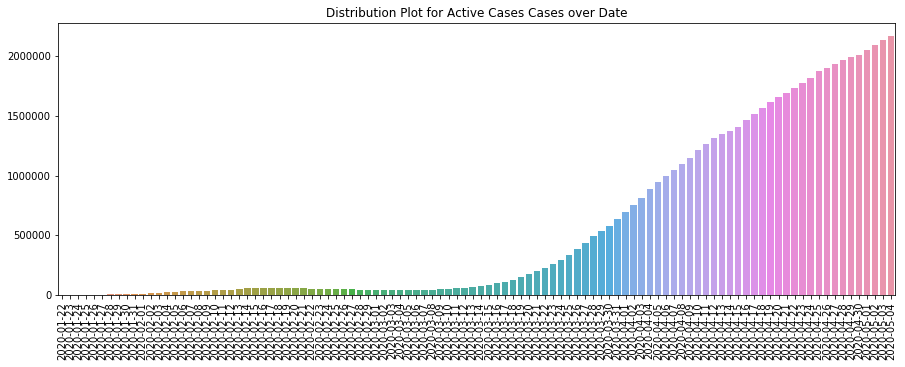

In [336]:
plt.figure(figsize=(15,5))
sns.barplot(x=datewise.index.date, y=datewise["Confirmed"]-datewise["Recovered"]-datewise["Deaths"])
plt.title("Distribution Plot for Active Cases Cases over Date")
plt.xticks(rotation=90)

Active Cases = Number of Confirmed Cases - Number of Recovered Cases - Number of Death Cases
Increase in number of Active Cases is is probably an indication of Recovered case or Death case number is dropping in comparison to number of Confirmed Cases drastically. Will look for the conclusive evidence for the same in the notebook ahead.

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103]),
 <a list of 104 Text xticklabel objects>)

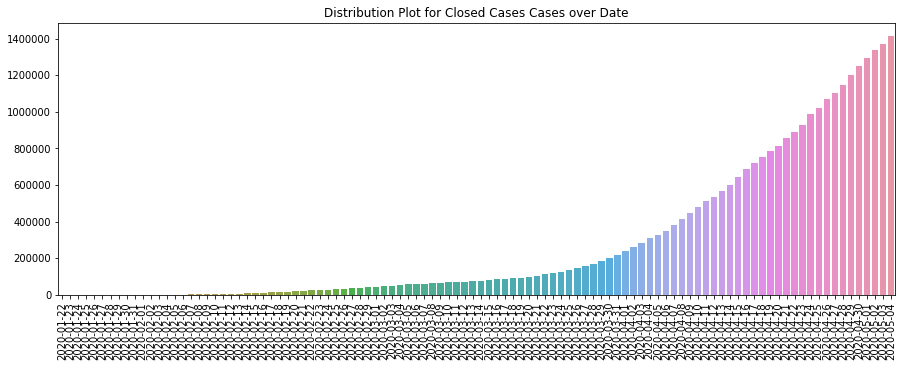

In [337]:
plt.figure(figsize=(15,5))
sns.barplot(x=datewise.index.date, y=datewise["Recovered"]+datewise["Deaths"])
plt.title("Distribution Plot for Closed Cases Cases over Date")
plt.xticks(rotation=90)

Closed Cases = Number of Recovered Cases + Number of Death Cases


Increase in number of Closed classes imply either more patients are getting recovered from the disease or more pepole are dying because of COVID-19


Growth rate of Confirmed, Recovered and Death Cases

## Visualization of Kenyan Cases

In [338]:
kenya_data=covid_df[covid_df['country/region']=='Kenya']
kenya_data=kenya_data[kenya_data['last_update']> '2020-03-10 20:00:00'] 
kenya_data.head()

,sno,country/region,confirmed,deaths,recovered,observation_date,last_update
5284,5285,Kenya,1.0,0.0,0.0,2020-03-13,2020-03-11 20:00:00
5616,5617,Kenya,1.0,0.0,0.0,2020-03-14,2020-03-13 22:22:03
5872,5873,Kenya,3.0,0.0,0.0,2020-03-15,2020-03-13 22:22:03
6105,6106,Kenya,3.0,0.0,0.0,2020-03-16,2020-03-16 00:22:11
6388,6389,Kenya,3.0,0.0,0.0,2020-03-17,2020-03-16 00:22:11


In [339]:
kenya_datewise=kenya_data.groupby(["last_update"]).agg({"confirmed":'sum',"recovered":'sum',"deaths":'sum'})
kenya_datewise=kenya_datewise.iloc[0:]
kenya_datewise


,confirmed,recovered,deaths
last_update,,,
2020-03-11 20:00:00,1.0,0.0,0.0
2020-03-13 22:22:03,4.0,0.0,0.0
2020-03-16 00:22:11,9.0,0.0,0.0
2020-03-19 02:33:08,21.0,0.0,0.0
2020-03-23 23:23:20,16.0,0.0,0.0
2020-03-24 23:41:50,25.0,0.0,0.0
2020-03-25 23:37:49,28.0,1.0,0.0
2020-03-26 23:53:24,31.0,1.0,1.0
2020-03-27 23:27:48,31.0,1.0,1.0


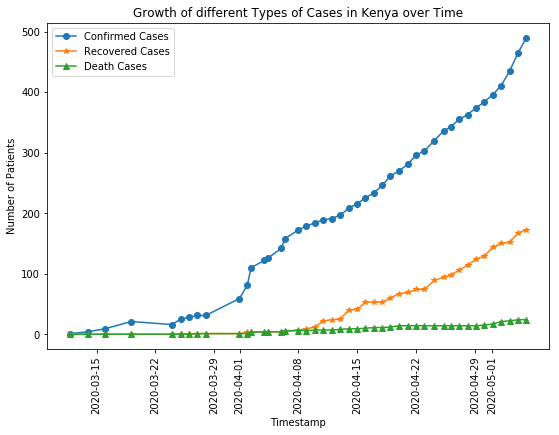

In [340]:
plt.figure(figsize=(9,6))
plt.plot(kenya_datewise["confirmed"],marker="o",label="Confirmed Cases")
plt.plot(kenya_datewise["recovered"],marker="*",label="Recovered Cases")
plt.plot(kenya_datewise["deaths"],marker="^",label="Death Cases")
plt.ylabel("Number of Patients")
plt.xlabel("Timestamp")
plt.xticks(rotation=90)
plt.title("Growth of different Types of Cases in Kenya over Time")
plt.legend()

## Global Cases Visulizations

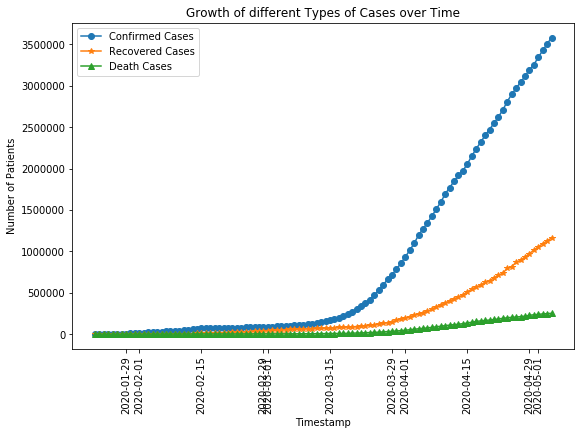

In [341]:
plt.figure(figsize=(9,6))
plt.plot(datewise["Confirmed"],marker="o",label="Confirmed Cases")
plt.plot(datewise["Recovered"],marker="*",label="Recovered Cases")
plt.plot(datewise["Deaths"],marker="^",label="Death Cases")
plt.ylabel("Number of Patients")
plt.xlabel("Timestamp")
plt.xticks(rotation=90)
plt.title("Growth of different Types of Cases over Time")
plt.legend()

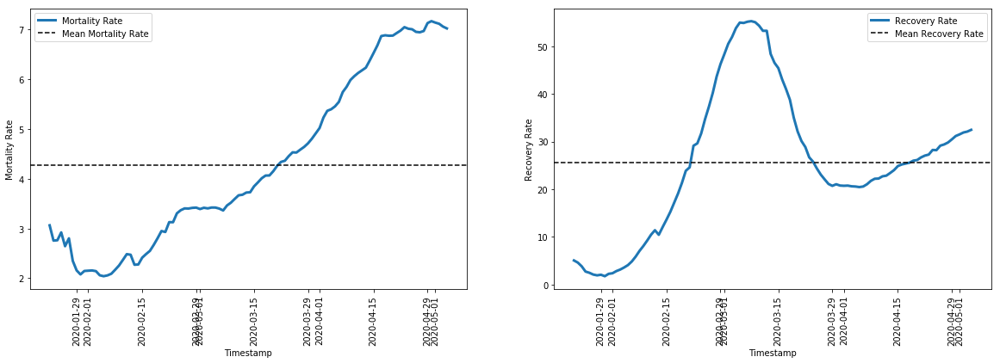

In [342]:
#Moratality and Recovery Rate analysis around the World
#Calculating the Mortality Rate and Recovery Rate
datewise["Mortality Rate"]=(datewise["Deaths"]/datewise["Confirmed"])*100
datewise["Recovery Rate"]=(datewise["Recovered"]/datewise["Confirmed"])*100
datewise["Active Cases"]=datewise["Confirmed"]-datewise["Recovered"]-datewise["Deaths"]
datewise["Closed Cases"]=datewise["Recovered"]+datewise["Deaths"]

#Plotting Mortality and Recovery Rate 
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,6))
ax1.plot(datewise["Mortality Rate"],label='Mortality Rate',linewidth=3)
ax1.axhline(datewise["Mortality Rate"].mean(),linestyle='--',color='black',label="Mean Mortality Rate")
ax1.set_ylabel("Mortality Rate")
ax1.set_xlabel("Timestamp")
ax1.legend()
for tick in ax1.get_xticklabels():
    tick.set_rotation(90)
ax2.plot(datewise["Recovery Rate"],label="Recovery Rate",linewidth=3)
ax2.axhline(datewise["Recovery Rate"].mean(),linestyle='--',color='black',label="Mean Recovery Rate")
ax2.set_ylabel("Recovery Rate")
ax2.set_xlabel("Timestamp")
ax2.legend()
for tick in ax2.get_xticklabels():
    tick.set_rotation(90)

Mortality rate = (Number of Death Cases / Number of Confirmed Cases) x 100


Recovery Rate= (Number of Recoverd Cases / Number of Confirmed Cases) x 100


Mortality rate increment is pretty significant along with drastic drop in recovery rate falling even below the average Recovery Rate around the World. That's a conclusive evidence why number of Active Cases are rising, also there is increase in number of Closed Cases as the mortality rate is a clear indication of increase number of Death Cases

Average increase in number of Confirmed Cases every day:  34447.0
Average increase in number of Recovered Cases every day:  11180.0
Average increase in number of Deaths Cases every day:  2418.0


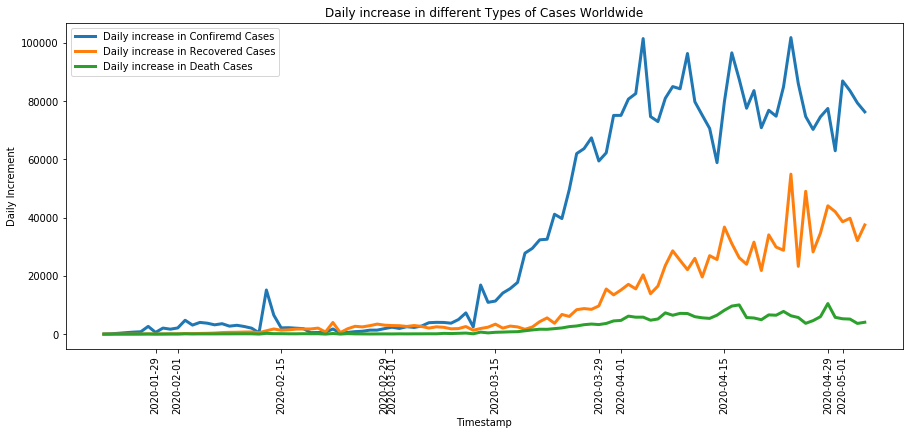

In [343]:
plt.figure(figsize=(15,6))
plt.plot(datewise["Confirmed"].diff().fillna(0),label="Daily increase in Confiremd Cases",linewidth=3)
plt.plot(datewise["Recovered"].diff().fillna(0),label="Daily increase in Recovered Cases",linewidth=3)
plt.plot(datewise["Deaths"].diff().fillna(0),label="Daily increase in Death Cases",linewidth=3)
plt.xlabel("Timestamp")
plt.ylabel("Daily Increment")
plt.title("Daily increase in different Types of Cases Worldwide")
plt.xticks(rotation=90)
plt.legend()

print("Average increase in number of Confirmed Cases every day: ",np.round(datewise["Confirmed"].diff().fillna(0).mean()))
print("Average increase in number of Recovered Cases every day: ",np.round(datewise["Recovered"].diff().fillna(0).mean()))
print("Average increase in number of Deaths Cases every day: ",np.round(datewise["Deaths"].diff().fillna(0).mean()))

Growth Factor
Growth factor is the factor by which a quantity multiplies itself over time. The formula used is:

Formula: Every day's new (Confirmed,Recovered,Deaths) / new (Confirmed,Recovered,Deaths) on the previous day.

A growth factor above 1 indicates an increase correspoding cases.

A growth factor above 1 but trending downward is a positive sign, whereas a growth factor constantly above 1 is the sign of exponential growth.

A growth factor constant at 1 indicates there is no change.

### Countrywise Analaysis

In [344]:
#Calculating countrywise Moratality and Recovery Rate
countrywise=df2[df2["ObservationDate"]==df2["ObservationDate"].max()].groupby(["Country/Region"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'}).sort_values(["Confirmed"],ascending=False)
countrywise["Mortality"]=(countrywise["Deaths"]/countrywise["Confirmed"])*100
countrywise["Recovery"]=(countrywise["Recovered"]/countrywise["Confirmed"])*100

Text(0.5, 1.0, 'Top 15 countries as per Number of Death Cases')

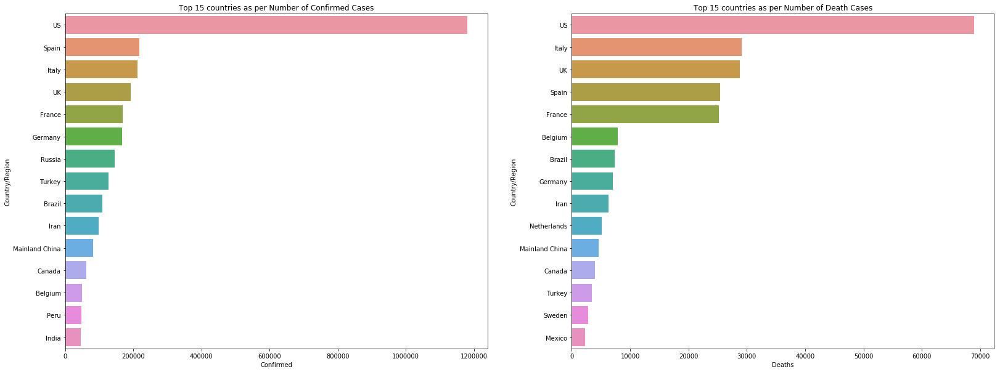

In [345]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(27,10))
top_15_confirmed=countrywise.sort_values(["Confirmed"],ascending=False).head(15)
top_15_deaths=countrywise.sort_values(["Deaths"],ascending=False).head(15)
sns.barplot(x=top_15_confirmed["Confirmed"],y=top_15_confirmed.index,ax=ax1)
ax1.set_title("Top 15 countries as per Number of Confirmed Cases")
sns.barplot(x=top_15_deaths["Deaths"],y=top_15_deaths.index,ax=ax2)
ax2.set_title("Top 15 countries as per Number of Death Cases")

Tourist Data: https://worldpopulationreview.com/countries/most-visited-countries/

International Students Data: https://www.easyuni.com/advice/top-countries-with-most-international-students-1184/

If we check the list of countries in accordance to number tourists visiters from link mentioned above, Top countries are mainly France, Spain, USA, China, Italy, Mexico, UK, Turkey, Germany, Thailand. Another thing to take into account most of the countries mentioned above also have highest number of International Students. All of the them are the most affected countries because of COVID-19

**Top 25 Countries as per Mortatlity Rate and Recovery Rate with more than 100 Confirmed Cases**


Text(0.5, 0, 'Recovery (in Percentage)')

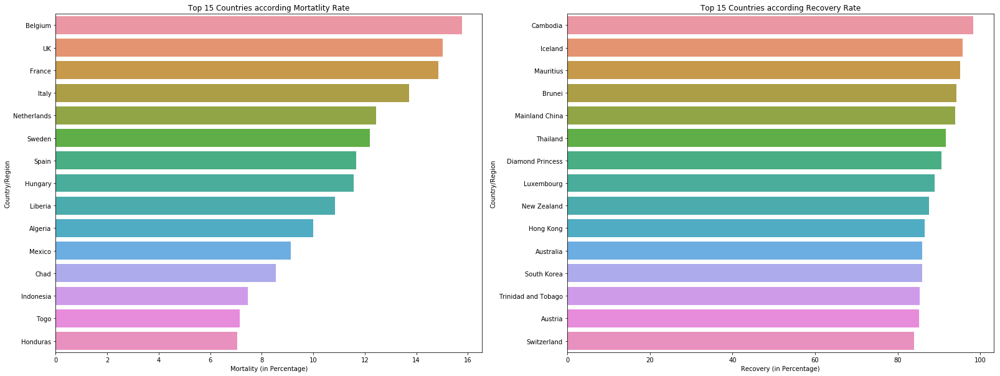

In [346]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(27,10))
countrywise_plot_mortal=countrywise[countrywise["Confirmed"]>100].sort_values(["Mortality"],ascending=False).head(15)
sns.barplot(x=countrywise_plot_mortal["Mortality"],y=countrywise_plot_mortal.index,ax=ax1)
ax1.set_title("Top 15 Countries according Mortatlity Rate")
ax1.set_xlabel("Mortality (in Percentage)")
countrywise_plot_recover=countrywise[countrywise["Confirmed"]>100].sort_values(["Recovery"],ascending=False).head(15)
sns.barplot(x=countrywise_plot_recover["Recovery"],y=countrywise_plot_recover.index, ax=ax2)
ax2.set_title("Top 15 Countries according Recovery Rate")
ax2.set_xlabel("Recovery (in Percentage)")

The mortality and recovery rates keep changing as new cases, recoveries and fatalities are confirmed.

Countries with more than 50 Confirmed and Cases with No Recovered Patients with considerable Mortality Rate

In [347]:
no_recovered_countries=countrywise[(countrywise["Confirmed"]>50)&(countrywise["Recovered"]==0)][["Confirmed","Deaths"]]
no_recovered_countries["Mortality Rate"]=(no_recovered_countries["Deaths"]/no_recovered_countries["Confirmed"])*100
no_recovered_countries[no_recovered_countries["Mortality Rate"]>0].sort_values(["Mortality Rate"],ascending=False)

,Confirmed,Deaths,Mortality Rate
Country/Region,,,
Tajikistan,230.0,3.0,1.304348


Countries with more than 100 Confirmed Cases and No Deaths with considerably high Recovery Rate

In [348]:
no_deaths=countrywise[(countrywise["Confirmed"]>100)&(countrywise["Deaths"]==0)]
no_deaths[no_deaths["Recovery"]>0].sort_values(["Recovery"],ascending=False).drop(["Mortality"],1)

,Confirmed,Recovered,Deaths,Recovery
Country/Region,,,,
Cambodia,122.0,120.0,0.0,98.360656
Vietnam,271.0,219.0,0.0,80.811808
Madagascar,149.0,99.0,0.0,66.442953
Rwanda,261.0,128.0,0.0,49.042146


Vietnam and Kuwait has able to contain COVID-19 pretty well with no Deaths recorded so far with pretty healthy Recovery Rate. Just for information Vietnam was the first country to inform World Health Organization about Human to Human Transmission of COVID-19.

Text(0.5, 1.0, 'Top 15 Countries with Most Number of Closed Cases')

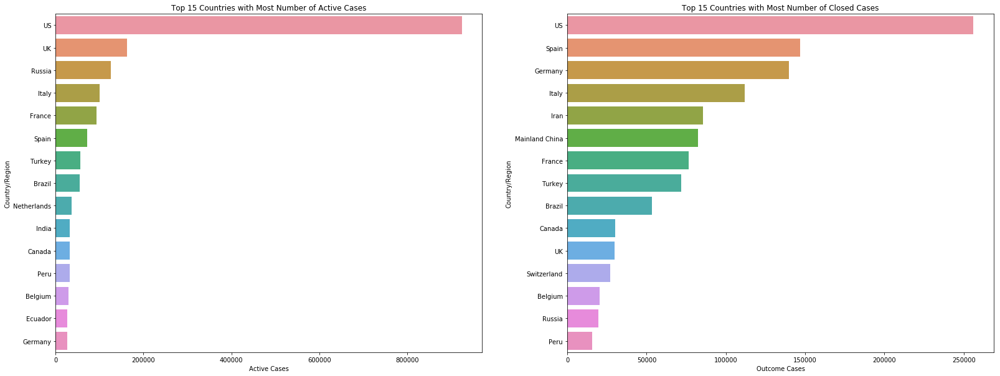

In [349]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(27,10))
countrywise["Active Cases"]=(countrywise["Confirmed"]-countrywise["Recovered"]-countrywise["Deaths"])
countrywise["Outcome Cases"]=(countrywise["Recovered"]+countrywise["Deaths"])
top_15_active=countrywise.sort_values(["Active Cases"],ascending=False).head(15)
top_15_outcome=countrywise.sort_values(["Outcome Cases"],ascending=False).head(15)
sns.barplot(x=top_15_active["Active Cases"],y=top_15_active.index,ax=ax1)
sns.barplot(x=top_15_outcome["Outcome Cases"],y=top_15_outcome.index,ax=ax2)
ax1.set_title("Top 15 Countries with Most Number of Active Cases")
ax2.set_title("Top 15 Countries with Most Number of Closed Cases")

In [350]:
countrywise.head()

,Confirmed,Recovered,Deaths,Mortality,Recovery,Active Cases,Outcome Cases
Country/Region,,,,,,,
US,1180375.0,187180.0,68922.0,5.838992,15.857672,924273.0,256102.0
Spain,218011.0,121343.0,25428.0,11.663632,55.659118,71240.0,146771.0
Italy,211938.0,82879.0,29079.0,13.720522,39.105304,99980.0,111958.0
UK,191832.0,910.0,28809.0,15.017828,0.474373,162113.0,29719.0
France,169583.0,51476.0,25204.0,14.862339,30.354458,92903.0,76680.0


## Multivariate Analysis

In [351]:
#Importing Necessary Libraries
import matplotlib.pyplot as plt
import plotly.graph_objects as go 
import seaborn as sns
import plotly
import plotly.express as px

In [352]:
#Setting up plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot, plot_mpl
import plotly.offline as py
init_notebook_mode(connected=True)

In [353]:
latest=pd.read_csv("/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv")

In [354]:
fig = px.bar(latest, x='ObservationDate', y='Confirmed', hover_data=['Province/State','Confirmed','Deaths', 'Recovered'], color='Country/Region')
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Barplot : Confirmed Cases per Country',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig.show()

In [355]:
fig = px.line(latest.loc[latest['Country/Region'] == 'Mainland China'], x='ObservationDate', y='Confirmed', hover_data=['Province/State', 'Deaths', 'Recovered','Confirmed'], color='Province/State')
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Line graph : Confirmed cases in Mainland China',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig.show()

- Wuhan is the capital city of Hubei province in the People's Republic of China

In [356]:
fig = px.line(pd.DataFrame(latest.groupby('ObservationDate')['Deaths'].sum().reset_index()), x="ObservationDate", y="Deaths")
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='World Cumulative Death Toll',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig.show()

In [357]:
pxdf = px.data.gapminder()
country_isoAlpha = pxdf[['country', 'iso_alpha']].drop_duplicates()
country_isoAlpha.rename(columns = {'country':'Country'}, inplace=True)
country_isoAlpha.set_index('Country', inplace=True)
country_map = country_isoAlpha.to_dict('index')

In [358]:
def getCountryIsoAlpha(country):
    try:
        return country_map[country]['iso_alpha']
    except:
        return country

In [359]:
latest.replace({'Country/Region': 'Mainland China'}, 'China', inplace=True)
latest['iso_alpha'] = latest['Country/Region'].apply(getCountryIsoAlpha)

In [360]:
latestplot = latest.groupby('iso_alpha').max().reset_index()
fig = px.choropleth(latestplot, locations="iso_alpha",
                    color="Confirmed",
                    hover_data=["Confirmed", "Deaths", "Recovered"],
                    color_continuous_scale="Viridis")
fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title='Map Visualization : Deaths Cases in World',margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [361]:
fig = px.scatter_geo(latest, locations="iso_alpha", 
                     color="Confirmed", size='Confirmed', hover_name="Country/Region", 
                    hover_data=["Confirmed", "Deaths", "Recovered"],
                     projection="natural earth", animation_frame="ObservationDate",title='Map Visualization : Confirmed Cases in the World per date ')
fig.show()

In [362]:
latestplot = latest.groupby('iso_alpha').max().reset_index()
fig = px.choropleth(latestplot, locations="iso_alpha",
                    color="Deaths",
                    hover_data=["Confirmed", "Deaths", "Recovered"],
                    color_continuous_scale="Viridis")
fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title='Map Visualization : Deaths Cases in World',margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [363]:
fig = px.scatter_geo(latest, locations="iso_alpha", 
                     color="Deaths", size='Deaths', hover_name="Country/Region", 
                    hover_data=["Confirmed", "Deaths", "Recovered"],
                     projection="natural earth", animation_frame="ObservationDate",title='Map Visualization : Deaths Cases in the World per date ')
fig.show()

In [364]:
latestplot = latest.groupby('iso_alpha').max().reset_index()
fig = px.choropleth(latestplot, locations="iso_alpha",
                    color="Recovered",
                    hover_data=["Confirmed", "Deaths", "Recovered"],
                    color_continuous_scale="Viridis")
fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title='Map Visualization : Recovered Cases in World',margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [365]:
fig = px.scatter_geo(latest, locations="iso_alpha", 
                     color="Recovered", size='Recovered', hover_name="Country/Region", 
                    hover_data=["Confirmed", "Deaths", "Recovered"],
                     projection="natural earth", animation_frame="ObservationDate",title='Map Visualization : Recovered Cases in the World per date ')
fig.show()

# Baseline: Prophet Forecasting Library

- We are using Facebook prophet as it is best for time series forecasting
- It follows the sklearn model API
- We create the instance of the Prophet class and calls its fit and predict fucntions


###  Fatalities forecast

In [366]:
from fbprophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error

from fbprophet.plot import plot_plotly

In [367]:
covid_df.columns

Index(['sno', 'country/region', 'confirmed', 'deaths', 'recovered',
       'observation_date', 'last_update'],
      dtype='object')

In [368]:
covid_train=pd.DataFrame(covid_df.groupby('last_update')['deaths'].sum())
covid_train=covid_train[covid_train['deaths']>16]


covid_train.head()

,deaths
last_update,
2020-01-22 17:00:00,17.0
2020-01-23 17:00:00,18.0
2020-01-24 17:00:00,26.0
2020-01-25 17:00:00,42.0
2020-01-26 16:00:00,56.0


In [369]:
# split_date = '2020-03-19'
# covid_train = covid_data.loc[covid_data['last_update'] <= split_date].copy()
# covid_test = covid_data.loc[covid_data['last_update']> split_date].copy()

In [370]:
# Setup and train model and fit
from fbprophet import Prophet
model = Prophet()
model.fit(covid_train.reset_index() \
              .rename(columns={'last_update':'ds',
                               'deaths':'y'}))

future = model.make_future_dataframe(periods=365)
recoverd_predicted = model.predict(future)

In [371]:
# Predict on training set with model
covid_test_fcst = model.predict(df=covid_train.reset_index() \
                                   .rename(columns={'last_update':'ds'}))

In [372]:
covid_test_fcst.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-22 17:00:00,4842.081544,-7570.579437,11940.594028,4842.081544,4842.081544,-2615.567240,-2615.567240,-2615.567240,-1850.395192,-1850.395192,-1850.395192,-765.172048,-765.172048,-765.172048,0.0,0.0,0.0,2226.514303
1,2020-01-23 17:00:00,4781.055600,-6315.007318,12124.643248,4781.055600,4781.055600,-1775.749370,-1775.749370,-1775.749370,-1850.395192,-1850.395192,-1850.395192,74.645823,74.645823,74.645823,0.0,0.0,0.0,3005.306231
2,2020-01-24 17:00:00,4720.029657,-7688.679196,11639.640229,4720.029657,4720.029657,-3289.379800,-3289.379800,-3289.379800,-1850.395192,-1850.395192,-1850.395192,-1438.984607,-1438.984607,-1438.984607,0.0,0.0,0.0,1430.649857
3,2020-01-25 17:00:00,4659.003713,-6786.544484,11984.466258,4659.003713,4659.003713,-2051.589952,-2051.589952,-2051.589952,-1850.395192,-1850.395192,-1850.395192,-201.194760,-201.194760,-201.194760,0.0,0.0,0.0,2607.413762
4,2020-01-26 16:00:00,4600.520518,-5915.820535,13117.815006,4600.520518,4600.520518,-995.240477,-995.240477,-995.240477,-2825.557706,-2825.557706,-2825.557706,1830.317230,1830.317230,1830.317230,0.0,0.0,0.0,3605.280041


### Plotting the forecast fatalities against actual fatalities

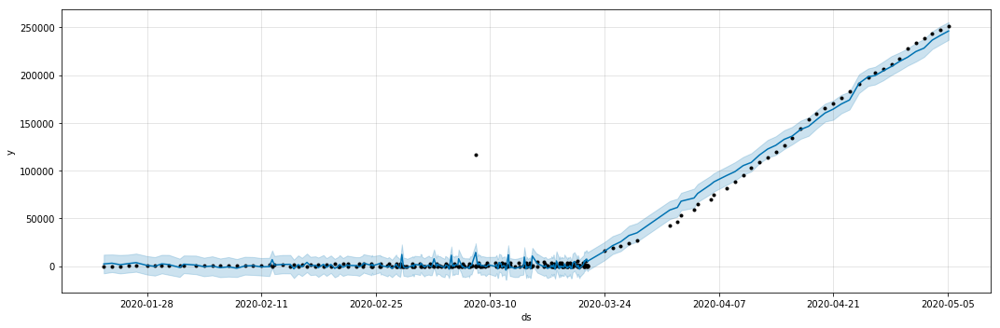

In [373]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(covid_test_fcst,
                 ax=ax)
plt.show()

In [374]:
from fbprophet import Prophet
future = model.make_future_dataframe(periods=365)
fatalities_predict = model.predict(future)

In [375]:
fig = plot_plotly(model, fatalities_predict)  
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Predictions : Fatalities',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig

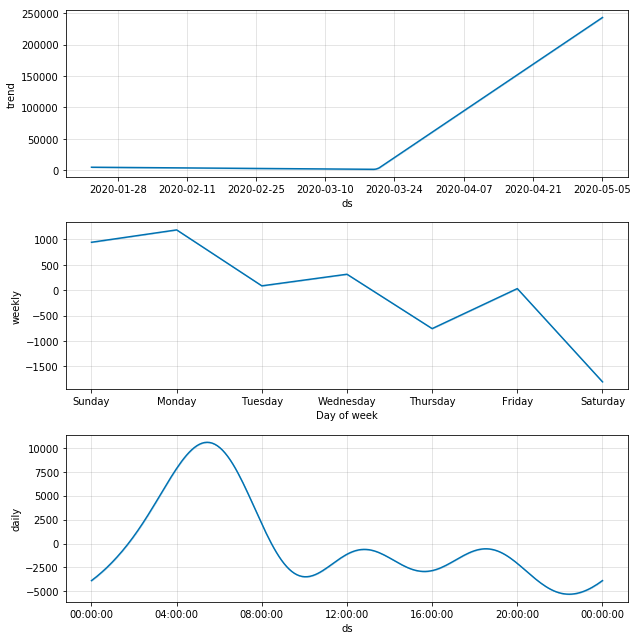

In [376]:
# Plot the components of the model
fig = model.plot_components(covid_test_fcst)

## Confirmed cases forecast

In [377]:
confirmed_train = pd.DataFrame(latest.groupby('ObservationDate')['Confirmed'].sum().reset_index()).rename(columns={'ObservationDate': 'ds', 'Confirmed': 'y'})
confirmed_train

,ds,y
0,01/22/2020,555.0
1,01/23/2020,653.0
2,01/24/2020,941.0
3,01/25/2020,1438.0
4,01/26/2020,2118.0
...,...,...
99,04/30/2020,3256846.0
100,05/01/2020,3343777.0
101,05/02/2020,3427343.0
102,05/03/2020,3506729.0


In [378]:
# Modelling 
prophet = Prophet()
prophet.fit(confirmed_train)
future = prophet.make_future_dataframe(periods=365)
confirmed_predict = prophet.predict(future)

In [379]:
fig = plot_plotly(prophet, confirmed_predict)  
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Predictions : Possible New Cases',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig

## Recovered cases forecast

In [380]:
recovered_train = pd.DataFrame(latest.groupby('ObservationDate')['Recovered'].sum().reset_index()).rename(columns={'ObservationDate': 'ds', 'Recovered': 'y'})
recovered_train

,ds,y
0,01/22/2020,28.0
1,01/23/2020,30.0
2,01/24/2020,36.0
3,01/25/2020,39.0
4,01/26/2020,52.0
...,...,...
99,04/30/2020,1014753.0
100,05/01/2020,1053327.0
101,05/02/2020,1093112.0
102,05/03/2020,1125236.0


In [381]:
forecast = Prophet()
forecast.fit(recovered_train)
future = forecast.make_future_dataframe(periods=365)
recoverd_predicted = prophet.predict(future)

In [382]:
fig = plot_plotly(forecast, recoverd_predicted)  
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Predictions : Recoveries forecasted over time',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig

## Model Evaluation and Optimisation

### 1.Fatalities Forecasting model

In [383]:
#Cross-validation

from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(model, initial='65 days', period='366 days', horizon = '22 days')
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-04-13 23:15:42,100232.678911,90558.307546,109690.832541,119482.0,2020-04-13 02:32:34
1,2020-04-14 23:41:11,104310.795006,95208.158592,113542.262326,125984.0,2020-04-13 02:32:34
2,2020-04-15 23:04:26,106813.086371,97756.518354,116643.034429,134177.0,2020-04-13 02:32:34
3,2020-04-16 23:38:19,110255.273467,100604.659816,119099.109843,143801.0,2020-04-13 02:32:34
4,2020-04-17 23:38:48,111728.890880,102281.270307,121582.178280,153822.0,2020-04-13 02:32:34
5,2020-04-18 22:40:18,118253.679270,108295.147046,127583.360110,159510.0,2020-04-13 02:32:34
6,2020-04-19 23:49:05,125238.790682,115985.577973,134977.081027,165044.0,2020-04-13 02:32:34
7,2020-04-20 23:44:50,126599.965969,116792.426504,136746.623343,169986.0,2020-04-13 02:32:34
8,2020-04-21 23:39:09,130910.217817,121158.627516,141090.365253,176583.0,2020-04-13 02:32:34
9,2020-04-22 23:38:57,133314.514581,124033.686200,142966.725043,183066.0,2020-04-13 02:32:34


In [384]:
# Performance Metrics
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p

,horizon,mse,rmse,mae,mape,mdape,coverage
0,1 days 21:08:37,4.201321e+08,20497.123909,20461.263042,0.166569,0.166569,0.0
1,2 days 20:31:52,6.092558e+08,24683.107420,24518.559311,0.187985,0.187985,0.0
2,3 days 21:05:45,9.370498e+08,30611.268658,30454.820081,0.218609,0.218609,0.0
3,4 days 21:06:14,1.448573e+09,38060.120888,37819.417827,0.253463,0.253463,0.0
4,5 days 20:07:44,1.736957e+09,41676.815111,41674.714925,0.266146,0.266146,0.0
5,6 days 21:16:31,1.643269e+09,40537.258719,40530.765024,0.249912,0.249912,0.0
6,7 days 21:12:16,1.733401e+09,41634.136461,41595.621674,0.248206,0.248206,0.0
7,8 days 21:06:35,1.984175e+09,44544.084799,44529.408107,0.256940,0.256940,0.0
8,9 days 21:06:23,2.280607e+09,47755.697742,47712.133801,0.265208,0.265208,0.0
9,11 days 00:59:01,2.534909e+09,50347.883869,50344.392648,0.269327,0.269327,0.0


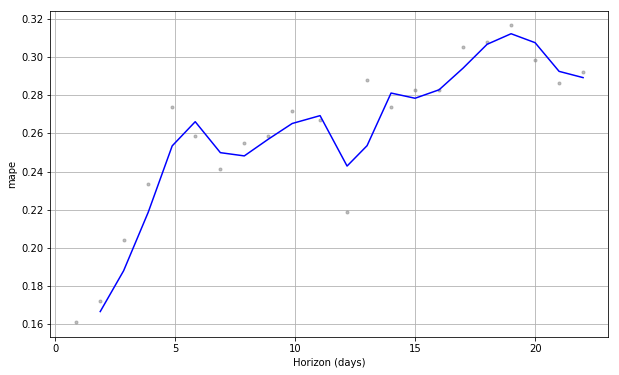

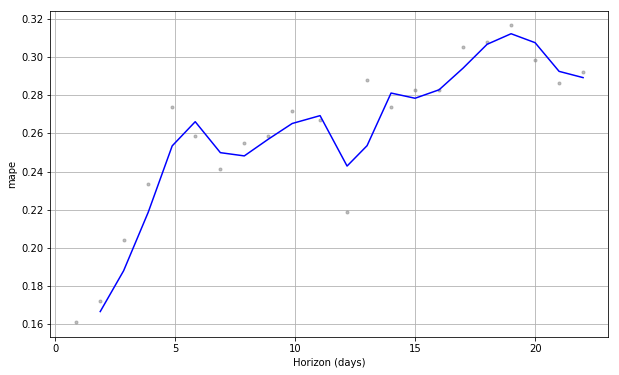

In [385]:
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')
fig

### Accuracy as of 1st May, 2020

A mean absolute percentage error shows the percentage error in predicted value against the actual value.As of 1st May,the mean absolute percentage error of 0.29, means the fatalities prediction model was able to predict with and error of 29%. The accuracy of the model would be 100%-29%. Therefore the model had an accuracy of 71%.

### 2.Recovered Cases Forecasting Model

In [386]:
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(forecast, initial='65 days', period='366 days', horizon = '22 days')
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-04-13,411081.791628,402747.297926,419432.355579,448655.0,2020-04-12
1,2020-04-14,428871.259390,420543.939570,437907.130922,474261.0,2020-04-12
2,2020-04-15,447557.504278,439069.709804,456198.187760,511019.0,2020-04-12
3,2020-04-16,465715.742384,456558.480492,475124.457616,542107.0,2020-04-12
4,2020-04-17,482358.868463,472252.758230,491953.339737,568343.0,2020-04-12
5,2020-04-18,500054.505412,489250.094394,510274.305949,592319.0,2020-04-12
6,2020-04-19,516675.682111,505658.386486,526731.104695,623903.0,2020-04-12
7,2020-04-20,531296.573606,519847.421644,542896.775164,645738.0,2020-04-12
8,2020-04-21,549086.041369,535405.481845,561663.797590,679819.0,2020-04-12
9,2020-04-22,567772.286257,554245.966985,580850.477231,709694.0,2020-04-12


In [387]:
# Performance Metrics
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p

,horizon,mse,rmse,mae,mape,mdape,coverage
0,2 days,1.735987e+09,41665.180547,41481.474491,0.089726,0.089726,0.0
1,3 days,3.043795e+09,55170.599017,54425.618166,0.109946,0.109946,0.0
2,4 days,4.931493e+09,70224.588569,69926.376669,0.132551,0.132551,0.0
3,5 days,6.614448e+09,81329.254012,81187.694577,0.146102,0.146102,0.0
4,6 days,7.953004e+09,89179.616050,89124.313062,0.153529,0.153529,0.0
5,7 days,1.000522e+10,100026.083256,99745.906238,0.163817,0.163817,0.0
6,8 days,1.229727e+10,110893.051578,110834.372141,0.174546,0.174546,0.0
7,9 days,1.509397e+10,122857.532426,122587.192512,0.184766,0.184766,0.0
8,10 days,1.861644e+10,136442.074347,136327.336187,0.196141,0.196141,0.0
9,11 days,2.170747e+10,147334.561422,147238.594690,0.203277,0.203277,0.0


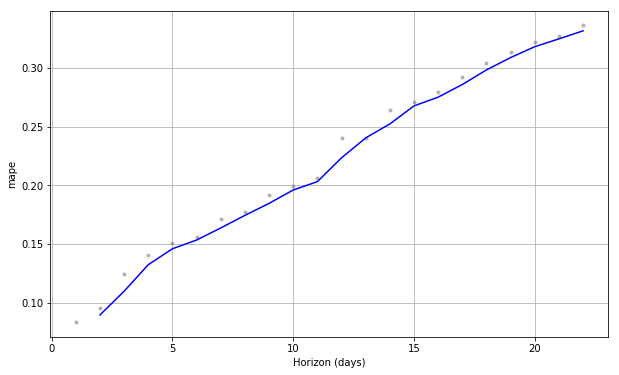

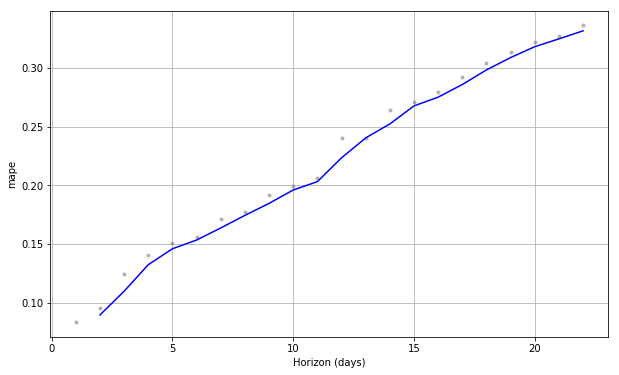

In [388]:
# MAPE plot
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')
fig

### Accuracy as of 1st May, 2020

An MAPE of 33% means that the recovery cases prediction model predicted with an error of 33% meaning it had an accuracy of 67%.

### 3.Confirmed Cases Forecasting Model

In [389]:
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(prophet, initial='65 days', period='366 days', horizon = '22 days')
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-04-13,1.901128e+06,1.889448e+06,1.913404e+06,1917320.0,2020-04-12
1,2020-04-14,1.979716e+06,1.966694e+06,1.994303e+06,1976192.0,2020-04-12
2,2020-04-15,2.060086e+06,2.045590e+06,2.075163e+06,2056055.0,2020-04-12
3,2020-04-16,2.141563e+06,2.125125e+06,2.159878e+06,2152647.0,2020-04-12
4,2020-04-17,2.221679e+06,2.199764e+06,2.240769e+06,2240191.0,2020-04-12
5,2020-04-18,2.301068e+06,2.275096e+06,2.325896e+06,2317759.0,2020-04-12
6,2020-04-19,2.376614e+06,2.342146e+06,2.405683e+06,2401379.0,2020-04-12
7,2020-04-20,2.450970e+06,2.410579e+06,2.488414e+06,2472259.0,2020-04-12
8,2020-04-21,2.529558e+06,2.478762e+06,2.573231e+06,2549123.0,2020-04-12
9,2020-04-22,2.609928e+06,2.551895e+06,2.659152e+06,2623960.0,2020-04-12


In [390]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p

,horizon,mse,rmse,mae,mape,mdape,coverage
0,2 days,1.372970e+08,11717.380268,9857.725866,0.005114,0.005114,0.5
1,3 days,1.433223e+07,3785.793515,3777.278897,0.001872,0.001872,1.0
2,4 days,6.955266e+07,8339.823553,7557.543211,0.003555,0.003555,1.0
3,5 days,2.327786e+08,15257.084034,14798.116929,0.006706,0.006706,1.0
4,6 days,3.106426e+08,17625.056215,17601.513350,0.007732,0.007732,1.0
5,7 days,4.459536e+08,21117.613298,20728.099115,0.008757,0.008757,1.0
6,8 days,5.332679e+08,23092.594340,23027.077011,0.009462,0.009462,1.0
7,9 days,4.180076e+08,20445.233393,20427.065306,0.008143,0.008143,1.0
8,10 days,2.898471e+08,17024.896245,16798.574453,0.006511,0.006511,1.0
9,11 days,2.512192e+08,15849.896486,15755.852678,0.005900,0.005900,1.0


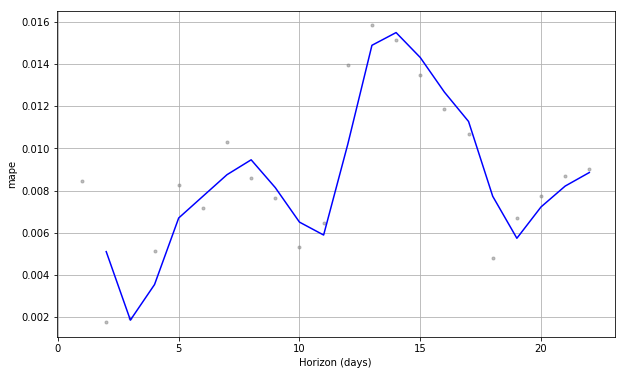

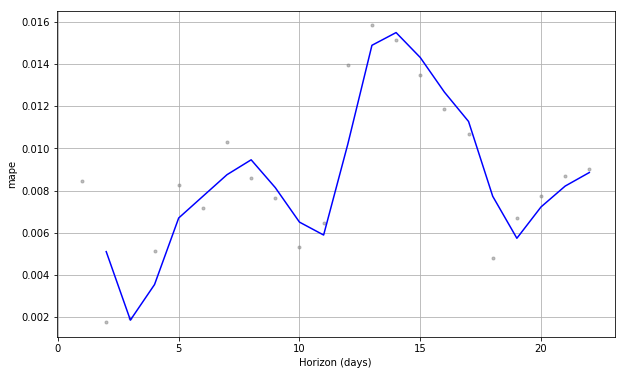

In [391]:
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')
fig

#### Accuracy as of 1st May, 2020

An MAPE of 0.08% means that the confirmed cases prediction model predicted with an error of 0.08% meaning it had an accuracy of 99.2%.

## Observation
 There were three forecasting models built, here are their performance:
 
* Confirmed cases: 99.2%
* Fatalities: 71%
* Recoveries: 67%


# Recurrent Neural Network Model

To challenge our solution we used Recurrent Neural Networks to predict fatalities.

In [392]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
# Import an Multi-Layer Perceptron Regressor model estimator from Scikit-Learn's neural_network library
from sklearn.neural_network import MLPRegressor
import matplotlib.pyplot as plt
from sklearn import metrics

### Creating dataframes for recovered and confirmed cases.

In [393]:
covid_one=pd.DataFrame(covid_df.groupby('last_update')['deaths'].sum())

covid_one.head()

,deaths
last_update,
2020-01-22 17:00:00,17.0
2020-01-23 17:00:00,18.0
2020-01-24 17:00:00,26.0
2020-01-25 17:00:00,42.0
2020-01-26 16:00:00,56.0


In [394]:
covid_two=pd.DataFrame(covid_df.groupby('last_update')['confirmed'].sum())

covid_two.head()

,confirmed
last_update,
2020-01-22 17:00:00,555.0
2020-01-23 17:00:00,653.0
2020-01-24 17:00:00,941.0
2020-01-25 17:00:00,1438.0
2020-01-26 16:00:00,2118.0


In [395]:
covid_two.head()

,confirmed
last_update,
2020-01-22 17:00:00,555.0
2020-01-23 17:00:00,653.0
2020-01-24 17:00:00,941.0
2020-01-25 17:00:00,1438.0
2020-01-26 16:00:00,2118.0


In [396]:
covid_two=covid_two.reset_index() \
              .rename(columns={'last_update':'ds',
                               'confirmed':'c'})
covid_two.head()

,ds,c
0,2020-01-22 17:00:00,555.0
1,2020-01-23 17:00:00,653.0
2,2020-01-24 17:00:00,941.0
3,2020-01-25 17:00:00,1438.0
4,2020-01-26 16:00:00,2118.0


In [397]:
covid_one=covid_one.reset_index() \
              .rename(columns={'last_update':'ds',
                               'deaths':'d'})
covid_one.head()

,ds,d
0,2020-01-22 17:00:00,17.0
1,2020-01-23 17:00:00,18.0
2,2020-01-24 17:00:00,26.0
3,2020-01-25 17:00:00,42.0
4,2020-01-26 16:00:00,56.0


### Dropping the date column

In [398]:
#dropping the ds column in covid_two and covid_train

covid_two=covid_two.drop(['ds'], 1, inplace=False)
covid=covid_one.drop(['ds'], 1, inplace=False)
covid.head()


,d
0,17.0
1,18.0
2,26.0
3,42.0
4,56.0


In [399]:
covid.shape

(1844, 1)

#### Dependent and independent variables

In [400]:
X= covid_two
Y=covid

In [401]:
# scaling the data
min_max_scaler = preprocessing.MinMaxScaler()
X_scale = min_max_scaler.fit_transform(X)

In [402]:
from sklearn.model_selection import train_test_split

In [403]:
#splitting data into train, test and validatation dataset
X_train, X_val_and_test, Y_train, Y_val_and_test = train_test_split(X_scale, Y, test_size=0.2)



In [404]:
X_val, X_test, Y_val, Y_test = train_test_split(X_val_and_test, Y_val_and_test, test_size=0.5)

In [405]:
print(X_train.shape, X_val.shape, X_test.shape, Y_train.shape, Y_val.shape, Y_test.shape)

(1475, 1) (184, 1) (185, 1) (1475, 1) (184, 1) (185, 1)


In [406]:
X_val, X_test, Y_val, Y_test = train_test_split(X_val_and_test, Y_val_and_test, test_size=0.5)

In [407]:
from keras.models import Sequential
from keras.layers import Dense

In [408]:
model = Sequential([
    Dense(100, activation='relu', input_shape=(1,)),
    Dense(100, activation='relu'),
    Dense(1, activation='relu'),
    
])

In [409]:
#compiling the model
model.compile(optimizer='adam',
              loss='mean_squared_error',
             metrics=['accuracy'])

In [410]:
#fitting the model
hist = model.fit(X_train, Y_train,
          batch_size=100, epochs=10,
          validation_data=(X_val, Y_val))

Train on 1475 samples, validate on 184 samples
Epoch 1/10
1475/1475 [==============================] - 0s 111us/step - loss: 497990717.7256 - accuracy: 0.3980 - val_loss: 222322822.5217 - val_accuracy: 0.4457
Epoch 2/10
1475/1475 [==============================] - 0s 18us/step - loss: 497990715.4873 - accuracy: 0.3980 - val_loss: 222322822.5217 - val_accuracy: 0.4457
Epoch 3/10
1475/1475 [==============================] - 0s 18us/step - loss: 497990715.5885 - accuracy: 0.3980 - val_loss: 222322822.5217 - val_accuracy: 0.4457
Epoch 4/10
1475/1475 [==============================] - 0s 18us/step - loss: 497990726.2011 - accuracy: 0.3980 - val_loss: 222322822.5217 - val_accuracy: 0.4457
Epoch 5/10
1475/1475 [==============================] - 0s 17us/step - loss: 497990730.0829 - accuracy: 0.3980 - val_loss: 222322822.5217 - val_accuracy: 0.4457
Epoch 6/10
1475/1475 [==============================] - 0s 18us/step - loss: 497990717.8231 - accuracy: 0.3980 - val_loss: 222322822.5217 - val_acc

In [411]:
model.evaluate(X_test, Y_test)[1]

185/185 [==============================] - 0s 37us/step


0.4324324429035187

The fatalities forecasting model had an accuracy of 43%.

Compared to the 71% accuracy of the fataliities forecasting model built using the prophet library, the RNN model performed poorly.

# Analysis of other epidemics

## Ebola

# Specify the Question

Following the COVID-19 outbreak that has lead to disruption of daily activities and has continued to cause death among the people,we shall look at other pandemics to compare with. This is to give a probablity of is likely happen with this current pandemic that was discovered in Wuhan,China.

# Context


Ebola virus disease (EVD), formerly known as Ebola haemorrhagic fever, is a rare but severe, often fatal illness in humans.
The virus is transmitted to people from wild animals and spreads in the human population through human-to-human transmission.
The average EVD case fatality rate is around 50%. Case fatality rates have varied from 25% to 90% in past outbreaks.
Community engagement is key to successfully controlling outbreaks.
Good outbreak control relies on applying a package of interventions, namely case management, infection prevention and control practices, surveillance and contact tracing, a good laboratory service, safe and dignified burials and social mobilisation.
Vaccines to protect against Ebola are under development and have been used to help control the spread of Ebola outbreaks in Guinea and in the Democratic Republic of the Congo (DRC).
Early supportive care with rehydration, symptomatic treatment improves survival. There is no licensed treatment proven to neutralize the virus but a range of blood, immunological and drug therapies are under development.
Pregnant and breastfeeding women with Ebola should be offered early supportive care. Likewise vaccine prevention and experimental treatment should be offered under the same conditions as for non-pregnant population.
 
The Ebola virus causes an acute, serious illness which is often fatal if untreated. EVD first appeared in 1976 in 2 simultaneous outbreaks, one in what is now Nzara, South Sudan, and the other in Yambuku, DRC. The latter occurred in a village near the Ebola River, from which the disease takes its name.

The 2014–2016 outbreak in West Africa was the largest Ebola outbreak since the virus was first discovered in 1976. The outbreak started in Guinea and then moved across land borders to Sierra Leone and Liberia. The current 2018-2019 outbreak in eastern DRC is highly complex, with insecurity adversely affecting public health response activities.

## Data Understanding and preparation

In [412]:
#read the data path
url = "/kaggle/input/ebola-outbreak-20142016-complete-dataset/ebola_data_db_format.csv"
path2 = "/kaggle/input/ebola-outbreak-20142016-complete-dataset/ebola_2014_2016_clean.csv"

#load the data
df = pd.read_csv(url)
df2 = pd.read_csv(path2)

#read the data
display(df)
df2

,Indicator,Country,Date,value
0,"Cumulative number of confirmed, probable and s...",Guinea,2015-03-10,3285.0
1,Cumulative number of confirmed Ebola cases,Guinea,2015-03-10,2871.0
2,Cumulative number of probable Ebola cases,Guinea,2015-03-10,392.0
3,Cumulative number of suspected Ebola cases,Guinea,2015-03-10,22.0
4,"Cumulative number of confirmed, probable and s...",Guinea,2015-03-10,2170.0
...,...,...,...,...
17580,"Cumulative number of confirmed, probable and s...",Spain,2016-03-23,0.0
17581,Cumulative number of confirmed Ebola deaths,United States of America,2016-03-23,1.0
17582,Cumulative number of probable Ebola deaths,United States of America,2016-03-23,0.0
17583,Cumulative number of suspected Ebola deaths,United States of America,2016-03-23,0.0


,Country,Date,No. of suspected cases,No. of probable cases,No. of confirmed cases,"No. of confirmed, probable and suspected cases",No. of suspected deaths,No. of probable deaths,No. of confirmed deaths,"No. of confirmed, probable and suspected deaths"
0,Guinea,2014-08-29,25.0,141.0,482.0,648.0,2.0,141.0,287.0,430.0
1,Nigeria,2014-08-29,3.0,1.0,15.0,19.0,0.0,1.0,6.0,7.0
2,Sierra Leone,2014-08-29,54.0,37.0,935.0,1026.0,8.0,34.0,380.0,422.0
3,Liberia,2014-08-29,382.0,674.0,322.0,1378.0,168.0,301.0,225.0,694.0
4,Sierra Leone,2014-09-05,78.0,37.0,1146.0,1261.0,11.0,37.0,443.0,491.0
...,...,...,...,...,...,...,...,...,...,...
2480,Liberia,2016-03-23,5636.0,1879.0,3151.0,10666.0,NaN,NaN,NaN,4806.0
2481,Italy,2016-03-23,0.0,0.0,1.0,1.0,NaN,NaN,NaN,0.0
2482,Liberia,2016-03-23,0.0,3.0,2.0,5.0,NaN,3.0,1.0,4.0
2483,Nigeria,2016-03-23,0.0,1.0,19.0,20.0,0.0,1.0,7.0,8.0


In [413]:
 df2.dtypes
# all the columns are floats except from Date and Country

Country                                             object
Date                                                object
No. of suspected cases                             float64
No. of probable cases                              float64
No. of confirmed cases                             float64
No. of confirmed, probable and suspected cases     float64
No. of suspected deaths                            float64
No. of probable deaths                             float64
No. of confirmed deaths                            float64
No. of confirmed, probable and suspected deaths    float64
dtype: object

In [414]:
#Converting "Date" into Datetime format
df2["Date"]=pd.to_datetime(df2["Date"])


In [415]:
df2.shape
#we have 2485 rows and 10 columns

(2485, 10)

In [416]:
#number of countries involved
df2.Country.unique()
# 10 countries available in our dataset

array(['Guinea', 'Nigeria', 'Sierra Leone', 'Liberia', 'Senegal',
       'United States of America', 'Spain', 'Mali', 'United Kingdom',
       'Italy'], dtype=object)

## Exploratory data analysis

#### 1. Total number of confirmed cases

In [417]:
country  = df2[df2.Date == df2.Date.max()].groupby ('Country')['No. of confirmed cases', 'No. of confirmed deaths'].sum().sort_values(by='No. of confirmed cases', ascending=False)
country.style.background_gradient(cmap='Greys')

# Sierra Leone has the highest number of confirmed cases 

,No. of confirmed cases,No. of confirmed deaths
Country,,
Sierra Leone,8704,3589
Guinea,3351,2083
Liberia,3162,4
Nigeria,19,7
Mali,7,0
United States of America,4,1
Italy,1,0
Senegal,1,0
Spain,1,0


#### 2. Deaths

In [418]:
death  = df2[df2.Date == df2.Date.max()].groupby ('Country')['No. of confirmed cases', 'No. of confirmed deaths'].sum().sort_values(by='No. of confirmed deaths', ascending=False)
death.style.background_gradient(cmap='cividis')
#Sierra Leone still has the highest number of confirmed cases

,No. of confirmed cases,No. of confirmed deaths
Country,,
Sierra Leone,8704,3589
Guinea,3351,2083
Nigeria,19,7
Liberia,3162,4
United States of America,4,1
Italy,1,0
Mali,7,0
Senegal,1,0
Spain,1,0


In [419]:
#group by countries
#segmentation by country
x = df2[df2.Date == df2.Date.max()]
deaths  = x.groupby (['Country'])['No. of confirmed cases', 'No. of confirmed deaths'].sum().reset_index()

In [420]:
df = deaths.sort_values(by= 'No. of confirmed cases', ascending=False)
fig = px.bar(df, x= 'No. of confirmed cases', y="Country", orientation='h'  , text = 'No. of confirmed cases' ,width=700, height=700, range_x = [0, max(deaths['No. of confirmed cases'])+500])
fig.update_traces(marker_color='red', opacity=0.8, textposition='outside')
fig.update_layout(
    
    title={
        'text':"Countries confirmed cases",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [421]:
df_two = pd.read_csv(path)
#Converting "Observation Date" into Datetime format
df_two["ObservationDate"]=pd.to_datetime(df_two["ObservationDate"])

date=df_two.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})

In [422]:
#increase in the spread by the day time 
#Grouping different types of cases as per the date
datewise=df2.groupby(["Date"]).agg({"No. of confirmed cases":'sum',"No. of confirmed deaths":'sum'}) 

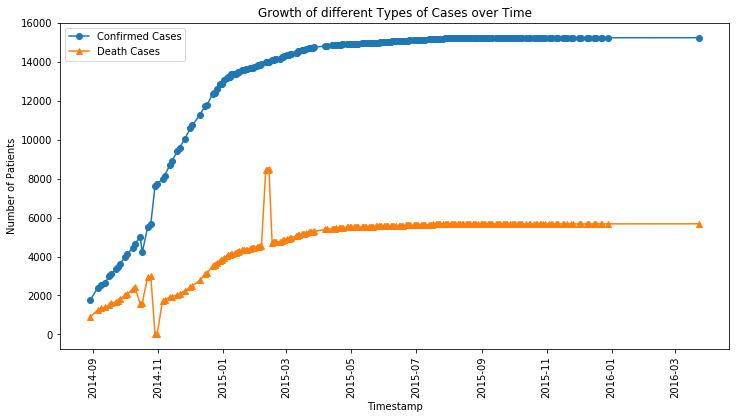

In [423]:
plt.figure(figsize=(12,6))
plt.plot(datewise["No. of confirmed cases"],marker="o",label="Confirmed Cases")

plt.plot(datewise["No. of confirmed deaths"],marker="^",label="Death Cases")
plt.ylabel("Number of Patients")
plt.xlabel("Timestamp")
plt.xticks(rotation=90)
plt.title("Growth of different Types of Cases over Time")
plt.legend()

#From this we can see that the curve has flattened with time which is the ideal objective with the COVID-19

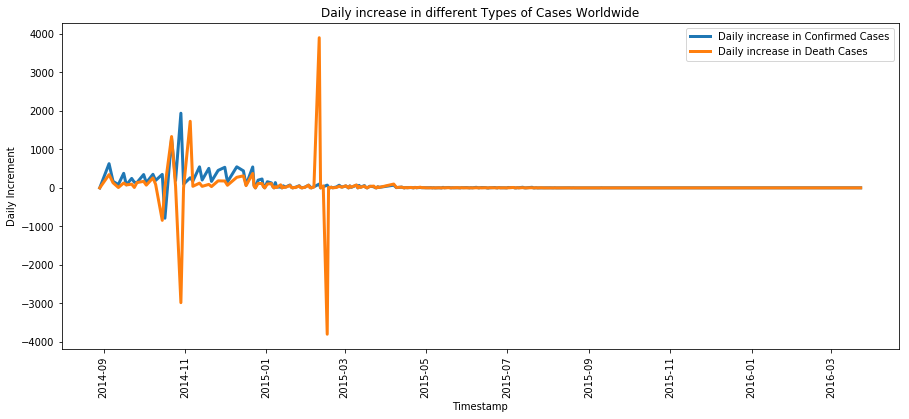

In [424]:
plt.figure(figsize=(15,6))
plt.plot(datewise["No. of confirmed cases"].diff().fillna(0),label="Daily increase in Confirmed Cases",linewidth=3)
plt.plot(datewise["No. of confirmed deaths"].diff().fillna(0),label="Daily increase in Death Cases",linewidth=3)

plt.xlabel("Timestamp")
plt.ylabel("Daily Increment")
plt.title("Daily increase in different Types of Cases Worldwide")
plt.xticks(rotation=90)
plt.legend()

# Conclusion

* COVID_19 has a high infection rate but a moderately low mortality rate. When compared to ebola which had a high mortality rate where around of those infected died.

* Predictive models for COVID 19 cases perform better with more data: the models built using the Facebook Prophet library have continued to improved as the days go by because it gets more data everyday. The first time we built the fatalities prediction model at the begining of April, it had an accuracy of 6%, however, as of 1st May, with more data, it improved to 71%.

* Since the RNN only had one independent variable for training, it may have contributed to the poor performance because even with a month's worth data added it did not improve performance. Perhaps if we had data on, the immunity of individuals, preexisting conditions, age and gender in this dataset it would have been useful.